In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import hashlib
import scipy.misc
import numpy as np
import scipy
import itertools
import math

## combining the CSVs

In [2]:
MSID=pd.read_csv("/kaggle/input/combined-mpox/MSID.csv")
MSID["source"]='MSID'
MSLD=pd.read_csv("/kaggle/input/combined-mpox/MSLD.csv")
MSLD["source"]='MSLD'
MSD=pd.DataFrame()
MSD=pd.concat([MSID,MSLD])
MSD.reset_index(inplace=True,drop=True)
MSD

,filename,paths,labels,source
0,monkeypox235.png,/kaggle/input/monkeypoxskinimagedataset/Monkey...,mpox,MSID
1,monkeypox273.png,/kaggle/input/monkeypoxskinimagedataset/Monkey...,mpox,MSID
2,monkeypox270.png,/kaggle/input/monkeypoxskinimagedataset/Monkey...,mpox,MSID
3,monkeypox132.png,/kaggle/input/monkeypoxskinimagedataset/Monkey...,mpox,MSID
4,monkeypox258.png,/kaggle/input/monkeypoxskinimagedataset/Monkey...,mpox,MSID
...,...,...,...,...
1520,CWP_41_02.jpg,/kaggle/input/mpox-skin-lesion-dataset-version...,CWP,MSLD
1521,CWP_38_02.jpg,/kaggle/input/mpox-skin-lesion-dataset-version...,CWP,MSLD
1522,CWP_41_01.jpg,/kaggle/input/mpox-skin-lesion-dataset-version...,CWP,MSLD
1523,CWP_33_05.jpg,/kaggle/input/mpox-skin-lesion-dataset-version...,CWP,MSLD


In [3]:
MSD["labels"].value_counts()

labels
mpox       563
normal     407
chpox      182
HFMD       161
measles    146
CWP         66
Name: count, dtype: int64

<Axes: ylabel='count'>

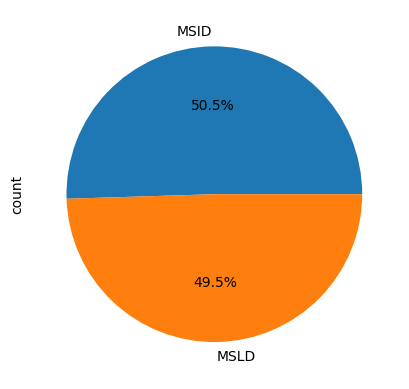

In [4]:
MSD["source"].value_counts().plot.pie(autopct='%1.1f%%')

<Axes: ylabel='count'>

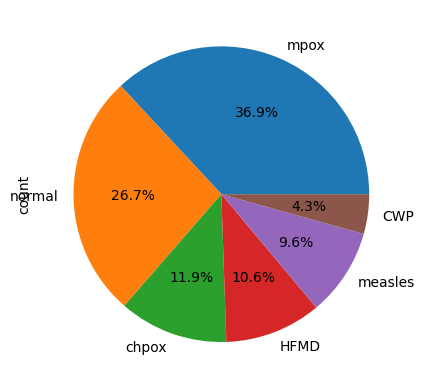

In [5]:
MSD["labels"].value_counts().plot.pie(autopct='%1.1f%%')

In [6]:
MSD.to_csv("MSD.csv",index=False)

## checking for duplicates in MonkeyPOX

[tutorial](http://https://www.youtube.com/watch?v=AIyJSGmkFXk)  for hashes and md5 algorithm 


In [7]:
duplicates_Mpox=[]
hash_keys= dict()
for path in MSD["paths"].loc[MSD["labels"]=="mpox"]:
    with open(path,"rb") as f:
        # print(path)
        file_hash=hashlib.md5(f.read()).hexdigest()
        if file_hash not in hash_keys:
            hash_keys[file_hash]=path
        else:
            duplicates_Mpox.append((path,hash_keys[file_hash]))

In [8]:
duplicates_Mpox

[('/kaggle/input/monkeypoxskinimagedataset/Monkeypox Skin Image Dataset/Monkeypox/monkeypox111.png',
  '/kaggle/input/monkeypoxskinimagedataset/Monkeypox Skin Image Dataset/Monkeypox/monkeypox112.png'),
 ('/kaggle/input/monkeypoxskinimagedataset/Monkeypox Skin Image Dataset/Monkeypox/monkeypox78.png',
  '/kaggle/input/monkeypoxskinimagedataset/Monkeypox Skin Image Dataset/Monkeypox/monkeypox67.png')]

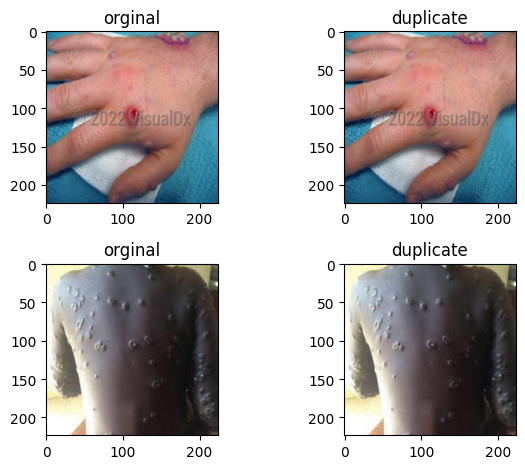

In [13]:
i=1
for duplicate in duplicates_Mpox:
    plt.subplot(len(duplicates_Mpox),2,i)
    i+=1
    plt.imshow(plt.imread(duplicate[0]))
    plt.title("orginal")
    plt.subplot(len(duplicates_Mpox),2,i)
    i+=1
    plt.imshow(plt.imread(duplicate[1]))
    plt.title("duplicate")
plt.tight_layout()
plt.show()

## duplicates in chickenpox

In [14]:
duplicates_CHpox=[]
hash_keys= dict()
i=0
for path in MSD["paths"].loc[MSD["labels"]=="chpox"]:
    with open(path,"rb") as f:
        file_hash=hashlib.md5(f.read()).hexdigest()
        if file_hash not in hash_keys:
            hash_keys[file_hash]=path
        else:
            duplicates_CHpox.append((path,hash_keys[file_hash]))

In [15]:
duplicates_CHpox

[('/kaggle/input/monkeypoxskinimagedataset/Monkeypox Skin Image Dataset/Chickenpox/chickenpox18.png',
  '/kaggle/input/monkeypoxskinimagedataset/Monkeypox Skin Image Dataset/Chickenpox/chickenpox20.png'),
 ('/kaggle/input/mpox-skin-lesion-dataset-version-20-msld-v20/Original Images/Original Images/FOLDS/fold1/Train/Chickenpox/CHP_26_01.jpg',
  '/kaggle/input/mpox-skin-lesion-dataset-version-20-msld-v20/Original Images/Original Images/FOLDS/fold1/Train/Chickenpox/CHP_62_01.jpg')]

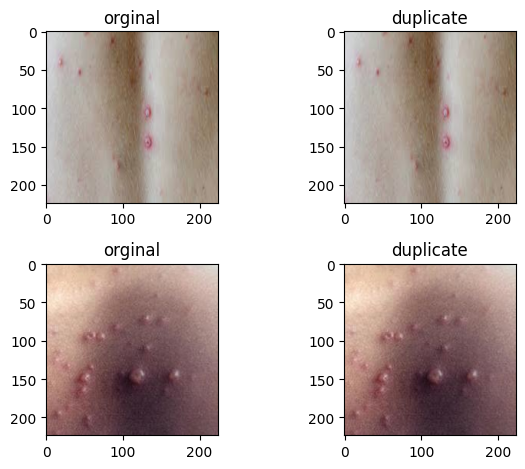

In [17]:
i=1
for duplicate in duplicates_CHpox:
    plt.subplot(len(duplicates_CHpox),2,i)
    i+=1
    plt.imshow(plt.imread(duplicate[0]))
    plt.title("orginal")
    plt.subplot(len(duplicates_CHpox),2,i)
    i+=1
    plt.imshow(plt.imread(duplicate[1]))
    plt.title("duplicate")
plt.tight_layout()
plt.show()

## duplicates in measles

In [19]:
duplicates_Meas=[]
hash_keys= dict()
for path in MSD["paths"].loc[MSD["labels"]=="measles"]:
    with open(path,"rb") as f:
        # print(path)
        file_hash=hashlib.md5(f.read()).hexdigest()
        if file_hash not in hash_keys:
            hash_keys[file_hash]=path
        else:
            duplicates_Meas.append((path,hash_keys[file_hash]))

In [20]:
duplicates_Meas

[('/kaggle/input/monkeypoxskinimagedataset/Monkeypox Skin Image Dataset/Measles/measles91.png',
  '/kaggle/input/monkeypoxskinimagedataset/Monkeypox Skin Image Dataset/Measles/measles40.png')]

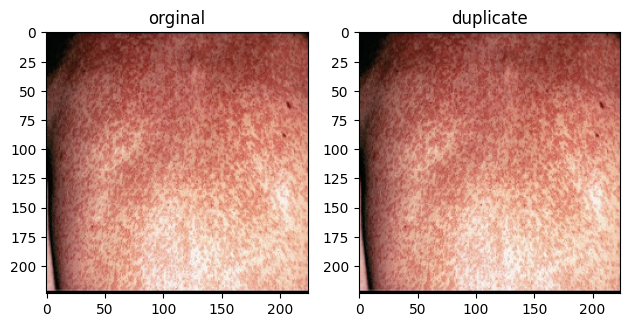

In [28]:
i=1
for duplicate in duplicates_Meas:
    plt.subplot(len(duplicates_Meas),2,i)
    i+=1
    plt.imshow(plt.imread(duplicate[0]))
    plt.title("orginal")
    plt.subplot(len(duplicates_Meas),2,i)
    i+=1
    plt.imshow(plt.imread(duplicate[1]))
    plt.title("duplicate")
plt.tight_layout()
plt.show()

## duplicates in cow pox

In [22]:
duplicates_CWP=[]
hash_keys= dict()
for path in MSD["paths"].loc[MSD["labels"]=="CWP"]:
    with open(path,"rb") as f:
        # print(path)
        file_hash=hashlib.md5(f.read()).hexdigest()
        if file_hash not in hash_keys:
            hash_keys[file_hash]=path
        else:
            duplicates_CWP.append((path,hash_keys[file_hash]))

In [23]:
duplicates_CWP

[]

## duplicates in Hand-Foot-mouth disease HFMD

In [24]:
duplicates_HFMD=[]
hash_keys= dict()
for path in MSD["paths"].loc[MSD["labels"]=="HFMD"]:
    with open(path,"rb") as f:
        # print(path)
        file_hash=hashlib.md5(f.read()).hexdigest()
        if file_hash not in hash_keys:
            hash_keys[file_hash]=path
        else:
            duplicates_HFMD.append((path,hash_keys[file_hash]))

In [25]:
duplicates_HFMD

[]

## duplicates in normal

In [26]:
duplicates_N=[]
hash_keys= dict()
for path in MSD["paths"].loc[MSD["labels"]=="normal"]:
    with open(path,"rb") as f:
        # print(path)
        file_hash=hashlib.md5(f.read()).hexdigest()
        if file_hash not in hash_keys:
            hash_keys[file_hash]=path
        else:
            duplicates_N.append((path,hash_keys[file_hash]))

In [27]:
duplicates_N

[('/kaggle/input/monkeypoxskinimagedataset/Monkeypox Skin Image Dataset/Normal/normal47.png',
  '/kaggle/input/monkeypoxskinimagedataset/Monkeypox Skin Image Dataset/Normal/normal54.png')]

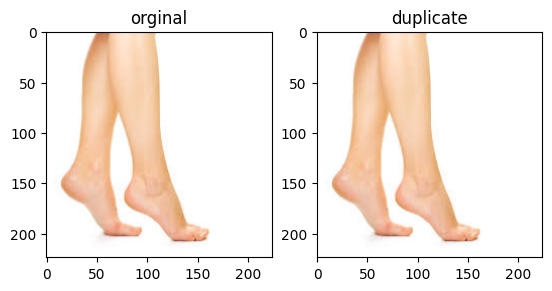

In [29]:
i=1
for duplicate in duplicates_N:
    plt.subplot(len(duplicates_N),2,i)
    i+=1
    plt.imshow(plt.imread(duplicate[0]))
    plt.title("orginal")
    plt.subplot(len(duplicates_N),2,i)
    i+=1
    plt.imshow(plt.imread(duplicate[1]))
    plt.title("duplicate")

# finding similairties 

the code is from [a youtube vid](http://https://www.youtube.com/watch?v=NzQDkQ6odK8&t=333s)

In [30]:
def filter_images(images):
    gray_list = []
    for image in images:
        if cv2.imread(image).shape[2] != 3:
                gray_list.append(image)
    return gray_list

In [31]:
def modify(image_list,height=60, width=60):
    ds_dict = {}
    duplicates = []
    for path in image_list:
        img = cv2.imread(path)
        image=np.average(img, weights=[0.299, 0.587, 0.114], axis=2)
        row_res = cv2.resize(image,(height, width), interpolation = cv2.INTER_AREA).flatten()
        col_res = cv2.resize(image,(height, width), interpolation = cv2.INTER_AREA).flatten('F')
        difference_row = np.diff(row_res)
        difference_col = np.diff(col_res)
        difference_row = difference_row > 0
        difference_col = difference_col > 0
        ds_dict[path] = np.vstack((difference_row, difference_col)).flatten()
    return ds_dict

In [32]:
def hamming_distance(list):
    duplicates=[]
    for k1,k2 in itertools.combinations(list, 2):
        score =scipy.spatial.distance.hamming(list[k1], list[k2])
        if score < .20 :
            duplicates.append((k1,k2))
    return duplicates

checking if there is a gray image in the dataset

In [33]:
image_files = filter_images(MSD["paths"])
image_files

[]

## similairties in Mpox

In [34]:
mpox_list=modify(MSD["paths"].loc[MSD["labels"]=="mpox"])
mpox_similairties=hamming_distance(mpox_list)

In [35]:
len(mpox_similairties)

42

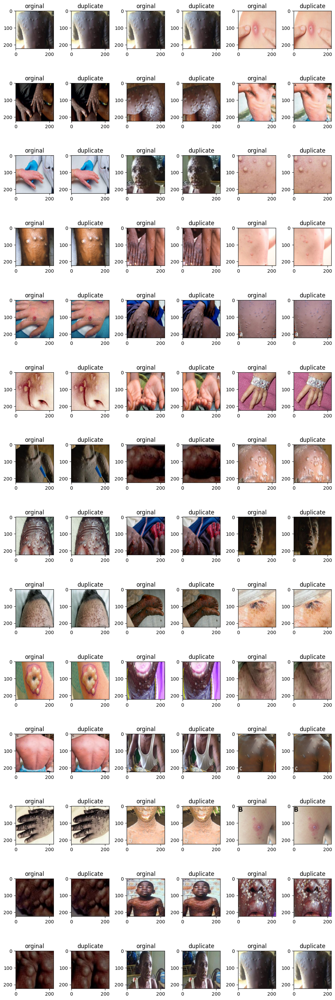

In [61]:
i=1
plt.figure(figsize=(10,30))
for duplicate in mpox_similairties:
    image_1=cv2.imread(duplicate[0])
    image_2=cv2.imread(duplicate[1])
    plt.subplot(math.ceil(len(mpox_similairties)/3),6,i)
    i+=1
    plt.imshow(plt.imread(duplicate[0]))
    plt.title("orginal")
    plt.subplot(math.ceil(len(mpox_similairties)/3),6,i)
    i+=1
    plt.imshow(plt.imread(duplicate[1]))
    plt.title("duplicate")
plt.tight_layout()
plt.show()

## similairties in chpox

In [43]:
chpox_list=modify(MSD["paths"].loc[MSD["labels"]=="chpox"])
chpox_similairties=hamming_distance(chpox_list)

In [44]:
len(chpox_similairties)

6

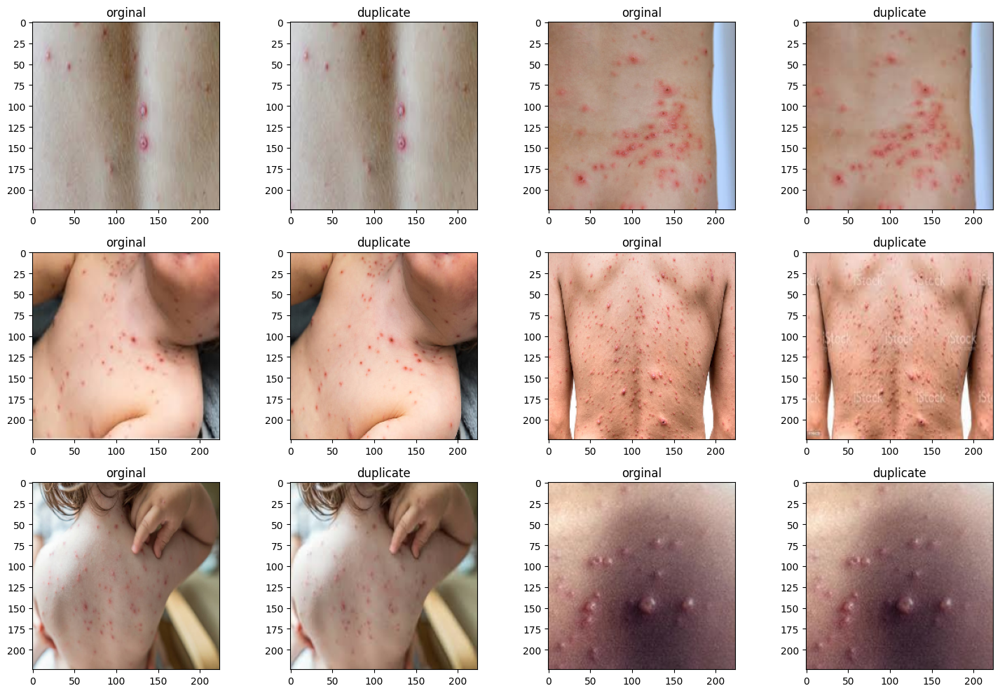

In [49]:
i=1
plt.figure(figsize=(15,10))
for duplicate in chpox_similairties:
    plt.subplot(math.ceil(len(chpox_similairties)/2),4,i)
    i+=1
    plt.imshow(plt.imread(duplicate[0]))
    plt.title("orginal")
    plt.subplot(math.ceil(len(chpox_similairties)/2),4,i)
    i+=1
    plt.imshow(plt.imread(duplicate[1]))
    plt.title("duplicate")
plt.tight_layout()
plt.show()

## similairties in measles

In [50]:
measles_list=modify(MSD["paths"].loc[MSD["labels"]=="measles"])
measles_similairties=hamming_distance(measles_list)

In [51]:
len(measles_similairties)

9

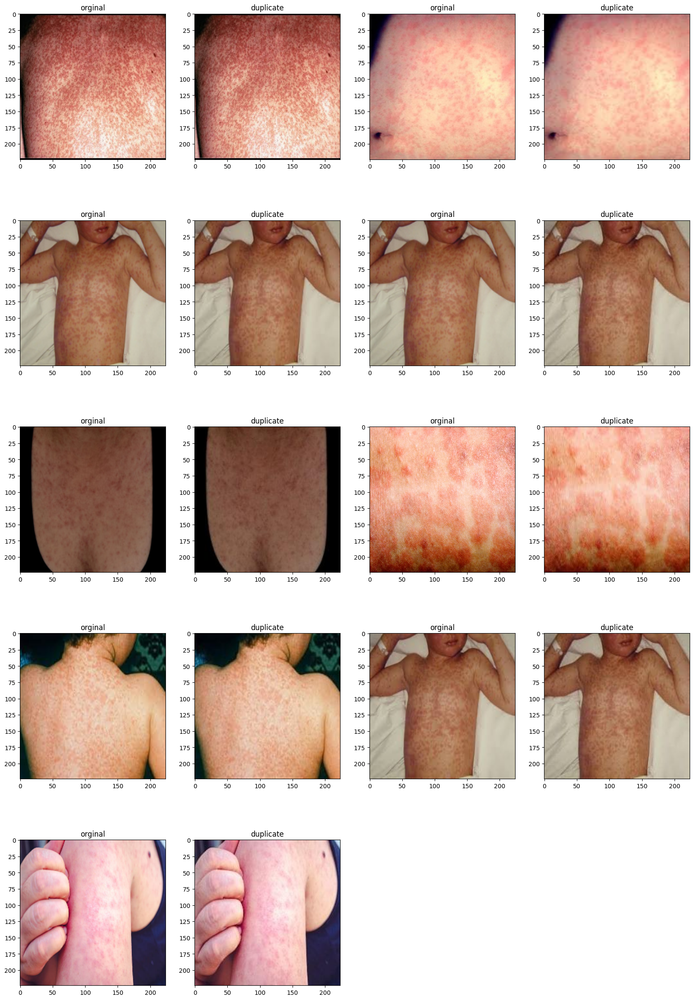

In [53]:
i=1
plt.figure(figsize=(20,30))
for duplicate in measles_similairties:
    plt.subplot(math.ceil(len(measles_similairties)/2),4,i)
    i+=1
    plt.imshow(plt.imread(duplicate[0]))
    plt.title("orginal")
    plt.subplot(math.ceil(len(measles_similairties)/2),4,i)
    i+=1
    plt.imshow(plt.imread(duplicate[1]))
    plt.title("duplicate")

## similairties in cow pox

In [54]:
CWP_list=modify(MSD["paths"].loc[MSD["labels"]=="CWP"])
CWP_similairties=hamming_distance(CWP_list)

In [55]:
len(CWP_similairties)

0

## similairties in HFMD

In [56]:
HFMD_list=modify(MSD["paths"].loc[MSD["labels"]=="HFMD"])
HFMD_similairties=hamming_distance(HFMD_list)

In [57]:
len(HFMD_similairties)

1

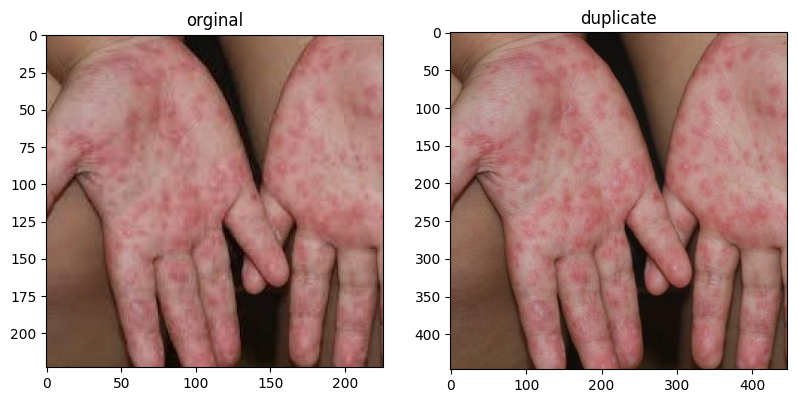

In [58]:
i=1
plt.figure(figsize=(20,30))
for duplicate in HFMD_similairties:
    image_1=cv2.imread(duplicate[0])
    image_2=cv2.imread(duplicate[1])
    plt.subplot(math.ceil(len(HFMD_similairties)/2),4,i)
    i+=1
    plt.imshow(plt.imread(duplicate[0]))
    plt.title("orginal")
    plt.subplot(math.ceil(len(HFMD_similairties)/2),4,i)
    i+=1
    plt.imshow(plt.imread(duplicate[1]))
    plt.title("duplicate")

## similarities in normal

In [62]:
normal_list =modify(MSD["paths"].loc[MSD["labels"]=="normal"])
normal_similairties=hamming_distance(normal_list)

In [63]:
len(normal_similairties)


14

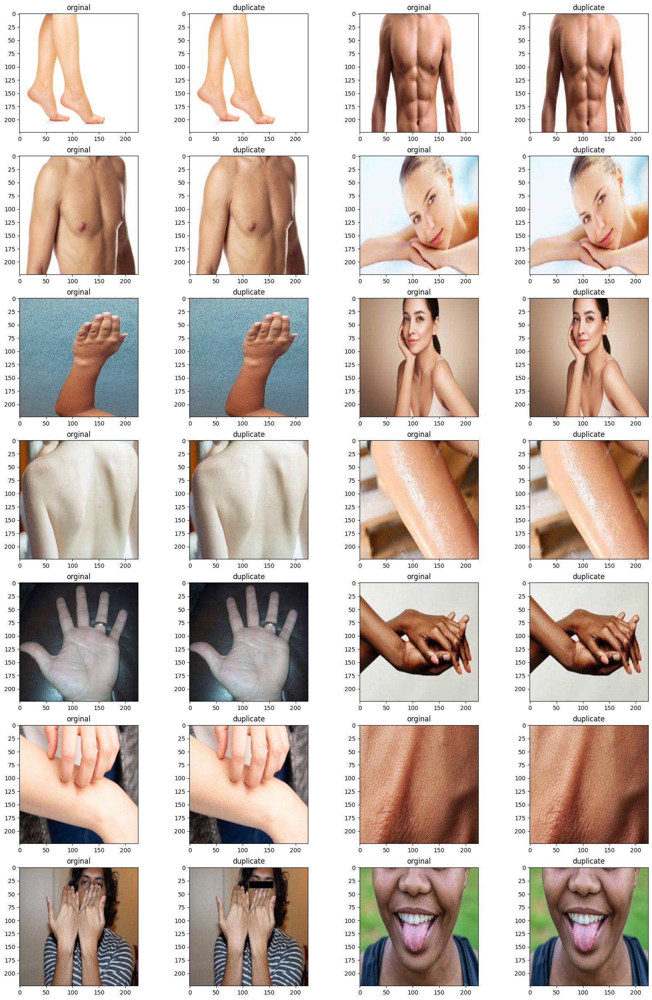

In [65]:
i=1
plt.figure(figsize=(20,30))
for duplicate in normal_similairties:
    image_1=cv2.imread(duplicate[0])
    image_2=cv2.imread(duplicate[1])
    plt.subplot(math.ceil(len(normal_similairties)/2),4,i)
    i+=1
    plt.imshow(plt.imread(duplicate[0]))
    plt.title("orginal")
    plt.subplot(math.ceil(len(normal_similairties)/2),4,i)
    i+=1
    plt.imshow(plt.imread(duplicate[1]))
    plt.title("duplicate")

##  dups

In [66]:
similairties=pd.DataFrame(mpox_similairties,columns=["orginal","duplicates"])
normal_similairties=pd.DataFrame(normal_similairties,columns=["orginal","duplicates"])
chpox_similairties=pd.DataFrame(chpox_similairties,columns=["orginal","duplicates"])
CWP_similairties=pd.DataFrame(CWP_similairties,columns=["orginal","duplicates"])
HFMD_similairties=pd.DataFrame(HFMD_similairties,columns=["orginal","duplicates"])
measles_similairties=pd.DataFrame(measles_similairties,columns=["orginal","duplicates"])


In [67]:
similairties=pd.concat([similairties,normal_similairties,chpox_similairties,CWP_similairties,HFMD_similairties,measles_similairties],ignore_index=True)

In [68]:
similairties.to_csv("similairties.csv",index=False)
similairties

,orginal,duplicates
0,/kaggle/input/monkeypoxskinimagedataset/Monkey...,/kaggle/input/monkeypoxskinimagedataset/Monkey...
1,/kaggle/input/monkeypoxskinimagedataset/Monkey...,/kaggle/input/mpox-skin-lesion-dataset-version...
2,/kaggle/input/monkeypoxskinimagedataset/Monkey...,/kaggle/input/mpox-skin-lesion-dataset-version...
3,/kaggle/input/monkeypoxskinimagedataset/Monkey...,/kaggle/input/mpox-skin-lesion-dataset-version...
4,/kaggle/input/monkeypoxskinimagedataset/Monkey...,/kaggle/input/monkeypoxskinimagedataset/Monkey...
...,...,...
67,/kaggle/input/monkeypoxskinimagedataset/Monkey...,/kaggle/input/mpox-skin-lesion-dataset-version...
68,/kaggle/input/monkeypoxskinimagedataset/Monkey...,/kaggle/input/monkeypoxskinimagedataset/Monkey...
69,/kaggle/input/monkeypoxskinimagedataset/Monkey...,/kaggle/input/mpox-skin-lesion-dataset-version...
70,/kaggle/input/monkeypoxskinimagedataset/Monkey...,/kaggle/input/mpox-skin-lesion-dataset-version...
